## Import packages 

In [1]:
from defs import *
from scipy import *

from prepare import load_object, save_object
from defs import Case, Interface2D
from phase import extract_phase
import numpy as np
import scipy
from prepare import field
from defs import Case, Interface2D
import gc
from sklearn.preprocessing import PolynomialFeatures
from sklearn.linear_model import LinearRegression
from funciones import * #in this file I have all functions I need here and I modify read_eta to take more "decimals" in time 


import pandas as pd
import math

from matplotlib import pyplot as plt
from scipy.signal import butter,filtfilt , hilbert

import sys, os
sys.path.append('/projects/DEIKE/jiarongw/jiarongw-postprocessing/jupyter_notebook/functions/')
sys.path.append('/projects/DEIKE/jiarongw/jiarongw-postprocessing/jupyter_notebook/project_specific/windwave/')
# sys.path.append('/home/jiarong/research/postprocessing/jupyter_notebook/functions/')
from tqdm import tqdm

"""Use customized plotting theme"""

import matplotlib as mpl
plt.style.use('/projects/DEIKE/jiarongw/jiarongw-postprocessing/media/matplotlib/stylelib/pof.mplstyle')


## Read eta data (from nicolo)

In [2]:
work_dir = '/projects/DEIKE/nscapin/re720_bo200_ak0p20_uoc0p5/'

# Leer el archivo de texto
data = np.loadtxt(work_dir+'eta/log_eta.out')

# Obtener la segunda columna
istep_c =data[:, 1]
print(istep_c.shape[0])
time = data[:,0] 
print(time)

464
[38.58268 38.68086 38.77903 38.87721 38.97538 39.07356 39.17173 39.26991
 39.36808 39.46626 39.56443 39.66261 39.76078 39.85896 39.95713 40.05531
 40.15348 40.25166 40.34983 40.44801 40.54618 40.64435 40.74253 40.8407
 40.93888 41.03705 41.13523 41.2334  41.33158 41.42975 41.52793 41.6261
 41.72428 41.82245 41.92063 42.0188  42.11698 42.21515 42.31333 42.4115
 42.50968 42.60785 42.70603 42.8042  42.90237 43.00055 43.09872 43.1969
 43.29507 43.39325 43.49142 43.5896  43.68777 43.78595 43.88412 43.9823
 44.08047 44.17865 44.27682 44.375   44.47317 44.57135 44.66952 44.7677
 44.86587 44.96404 45.06222 45.16039 45.25857 45.35674 45.45492 45.55309
 45.65127 45.74944 45.84762 45.94579 46.04397 46.14214 46.24032 46.33849
 46.43667 46.53484 46.63302 46.73119 46.82937 46.92754 47.02572 47.12389
 47.22206 47.32024 47.22206 47.32024 47.41841 47.51659 47.61476 47.71294
 47.81111 47.90929 48.00746 48.10564 48.20381 48.30199 48.40016 48.49834
 48.59651 48.69469 48.79286 48.89104 48.98921 49.0873

In [3]:
# 0, 1 , 12 column is eta 

In [4]:
L0 = 2*np.pi; N = 512;
eta_series = np.zeros((istep_c.shape[0],N,N), dtype=np.float32)
j=0
for i in istep_c:
    etalo = np.fromfile(work_dir+'eta/eta_loc/eta_loc_t0000'+str(int(i))+'.bin')
    size  = etalo.shape;
    tot_row = 18
    tot_row_i = int(size[0]/tot_row);
    etalo = etalo.reshape([tot_row_i, tot_row]);
    
    eta_m0  = 1.0; cirp_th = 0.20;
    new_row = 0;
    for i in range(tot_row_i):
        if ( abs(etalo[i][12]-eta_m0) < cirp_th ):
            new_row += 1;
    #
    print('iteration', j ,"Second pass of remove")
    etal = np.zeros([new_row, 18]);
    for i in range(new_row):
        if ( abs(etalo[i][12]-eta_m0) < cirp_th ):
            etal[i][:] = etalo[i][:];
    xarray = np.linspace(-L0/2., L0/2.,N,endpoint=False)+L0/2/N/2 # Centered grid for interpolation
    yarray = np.linspace(-L0/2., L0/2.,N,endpoint=False)+L0/2/N/2 # Centered grid for interpolation
    xtile, ytile = np.meshgrid(xarray,yarray)
    eta = griddata((etal[:,0].ravel(), etal[:,1].ravel()), etal[:,12].ravel(), (xtile, ytile), method='nearest')
    eta_series[j]= eta
    j+=1

iteration 0 Second pass of remove
iteration 1 Second pass of remove
iteration 2 Second pass of remove
iteration 3 Second pass of remove
iteration 4 Second pass of remove
iteration 5 Second pass of remove
iteration 6 Second pass of remove
iteration 7 Second pass of remove
iteration 8 Second pass of remove
iteration 9 Second pass of remove
iteration 10 Second pass of remove
iteration 11 Second pass of remove
iteration 12 Second pass of remove
iteration 13 Second pass of remove
iteration 14 Second pass of remove
iteration 15 Second pass of remove
iteration 16 Second pass of remove
iteration 17 Second pass of remove
iteration 18 Second pass of remove
iteration 19 Second pass of remove
iteration 20 Second pass of remove
iteration 21 Second pass of remove
iteration 22 Second pass of remove
iteration 23 Second pass of remove
iteration 24 Second pass of remove
iteration 25 Second pass of remove
iteration 26 Second pass of remove
iteration 27 Second pass of remove
iteration 28 Second pass of re

In [5]:
print(eta_series.shape)

(464, 512, 512)


#### Read eta data

# Shape $\eta (x,y)$ 

findfont: Font family ['Open Sans'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Open Sans'] not found. Falling back to DejaVu Sans.


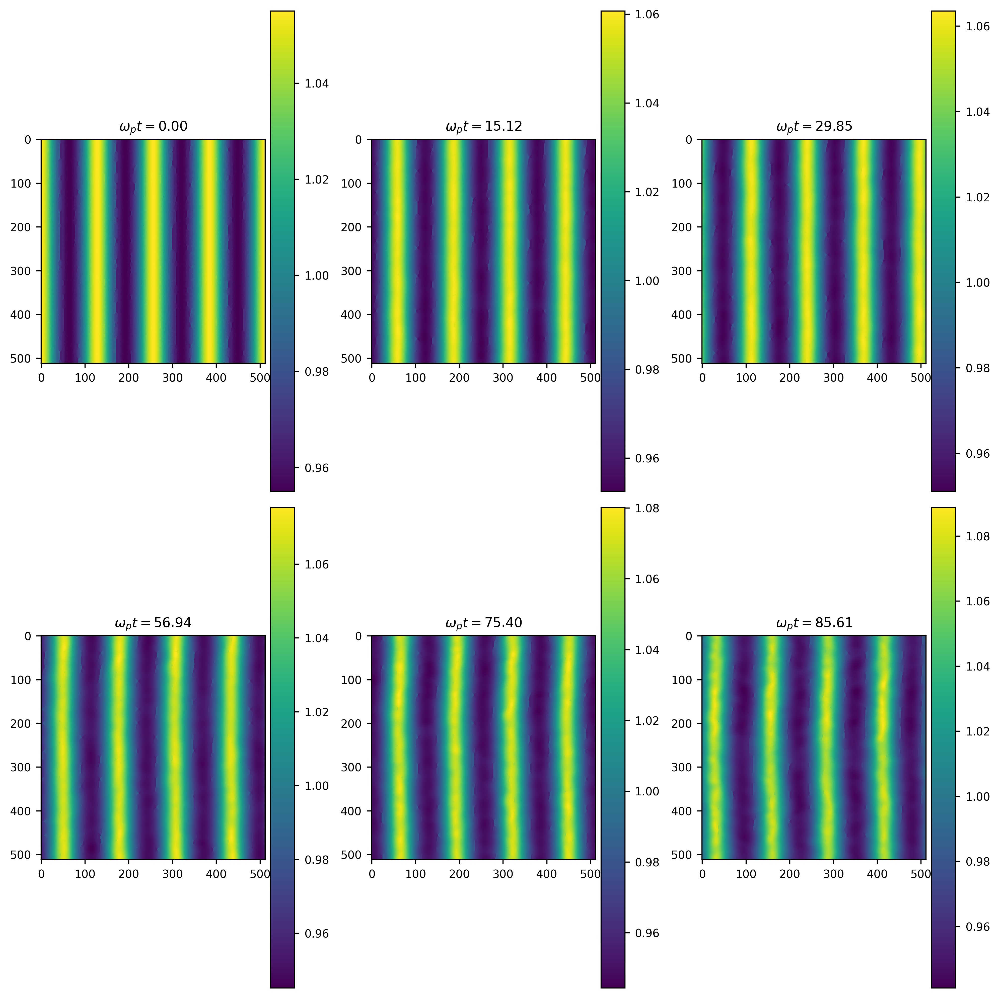

In [6]:
ind_time = [0,77,154,300,400,-1] #index of the times we are interested in (depends on length of time) 
kp = 4; omegap = (1*kp)**0.5

tstart=time[0]


num_rows = 2
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))

j = 0

for i in ind_time:
    eta = eta_series[i]
    plt.imshow(eta)
 
    ax = axes[j // num_cols, j % num_cols]
    #tstart=case7.tstart
    
    #eta graph
    im = ax.imshow(eta)  

    ax.set_title(label=r'$\omega_{p} t=%.2f$'%(omegap*(time[i]-tstart))) # Agregar un título al subplot
    
    fig.colorbar(im , ax=ax, orientation='vertical', pad=0.02)

    j += 1
    

plt.tight_layout()
#plt.savefig("g1_tend", dpi=300)
plt.show()

## E(kx,ky): Energy in Cartesian coordinates

$\eta(x,y) \rightarrow FFT \rightarrow  \hat{\eta}(kx,ky) \rightarrow E(kx,ky) = |\hat{\eta}(kx,ky)|^{2}$

In [7]:

#initialization of lists for checking

variance =[]
integral = []
polar_integral = []

kp = 4; omegap = (1*kp)**0.5

def spectrum_integration(eta, N,L,CHECK=False):
    
    """ 
    Input : 
        - eta
        - N : number of points
        - L : length domain
    
    Ouput :
        - k , kx , ky , theta : wavenumber vector , his components in x and y , angle theta 
        - F_center: F(kx, ky)
        - F_center_polar: F(k,theta)
        - F_center_polar_integrated : F(k) (azimuthal integration of the 2D spectrum)
        - k_tile , theta_tile : mesh in (k,theta)
        - kxp_tile, kyp_tile : mesh in (kx,ky) from (k,theta)
        - variance, integral, polar_integral : list for checking 
    
    """
    
    varr =  np.var(eta)
    if CHECK: print('var', varr)
    variance.append(varr)
    
    #print('mean', np.mean(eta))
    
    wavenumber =  2*np.pi*np.fft.fftfreq(N,L/N)
    kx = np.fft.fftshift(wavenumber); ky = kx
    kx_tile, ky_tile = np.meshgrid(kx,ky)
    
    theta = np.linspace(-np.pi,np.pi, 100)
    
    #xs = 2*m.pi ; ys=xs
    #rmax = (xs**2 + ys**2)**0.5
    #radii = np.linspace(0, rmax, 100, endpoint=True)
    
    
    k = wavenumber[0:int(N/2)]
    dkx = kx[1] - kx[0]; dky = ky[1] - ky[0]
    dk = k[1]-k[0]; dtheta = theta[1]-theta[0]
    
    spectrum = np.fft.fft2(eta/(N*N)**0.5) # FFT normalization 
    F = np.absolute(spectrum)**2/N**2/(dkx*dky) # Per area normalization -> F(kx,ky)
    
    if CHECK: print ('sum F', np.sum(F))
    F_center = np.fft.fftshift(F,axes=(0,1)) # Further normalization by independent variables
    
    k_tile, theta_tile = np.meshgrid(k,theta)
    kxp_tile, kyp_tile = pol2cart(k_tile, theta_tile)
    
    
    
    integ = np.sum(F_center)*dkx*dky # F
    if CHECK: print('integral',integ)
    integral.append(integ)
    
    
    F_center_polar = scipy.interpolate.griddata((kx_tile.ravel(),ky_tile.ravel()), F_center.ravel(), (kxp_tile, kyp_tile), method='nearest', fill_value=0) #F(k,theta)
    
    F_center_polar_integrated = np.sum(F_center_polar*k_tile, axis=0)*dtheta # Azimuthal integration
    int_pol = np.sum(F_center_polar_integrated)*dk # F
    if CHECK: print ('sum polar integrated', int_pol)
    
    
    if CHECK: print('F center', F_center.shape , 'F polar', F_center_polar.shape , 'F center polar integrated' , F_center_polar_integrated.shape)
    
    polar_integral.append(int_pol)
    
    return k, F_center, F_center_polar_integrated , F_center_polar , k_tile, kxp_tile, kyp_tile , theta_tile , theta , variance, integral, polar_integral , kx, ky

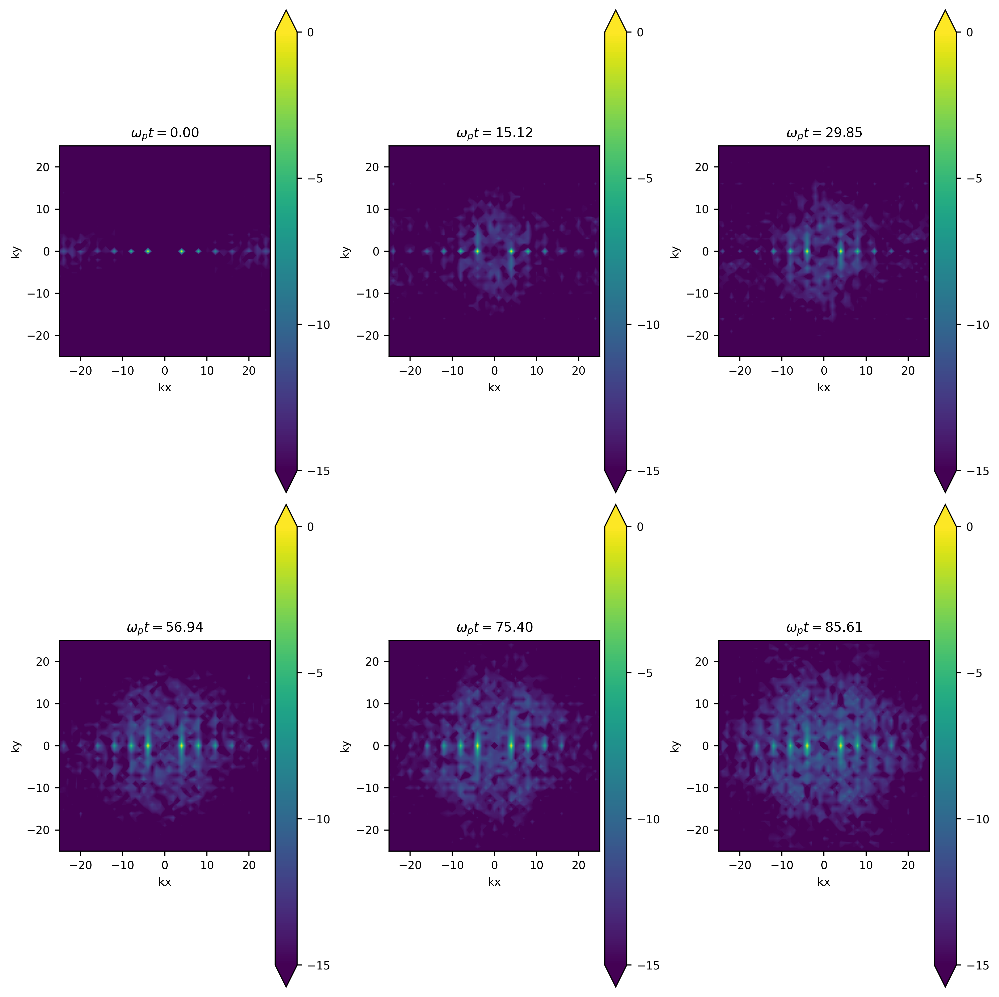

In [8]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

num_rows = 2
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))

j = 0



N = 512
L = 2 * np.pi
lim = 200

for i in ind_time:
    
    eta = eta_series[i]
    
    k, F_center, F_center_polar_integrated, F_center_polar, k_tile, kxp_tile, kyp_tile, theta_tile, theta, variance, integral, polar_integral, kx, ky = spectrum_integration(eta - np.mean(eta), N, L, CHECK=False)
    
    norm = np.argmax(F_center)
    
    vmin = -15
    vmax = 0
    levels = np.linspace(vmin, vmax, 200)
    
    ax = axes[j // num_cols, j % num_cols]
    
    im = ax.contourf(kx, ky, np.log(F_center/np.max(F_center)), levels=levels, extend='both')
    
    ax.set_aspect('equal')
    ax.set_title(label=r'$\omega_{p} t=%.2f$' % (omegap * (time[i] - tstart)))
    ax.set_xlabel('kx')
    ax.set_ylabel('ky')
    ax.set_ylim([-25, 25])
    ax.set_xlim([-25, 25])
    
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    cbar.ax.yaxis.set_major_locator(plt.FixedLocator([-20, -15, -10, -5, 0]))
    
    j += 1
    
plt.tight_layout()
plt.show()


## E(k,$\theta$): 

var 0.0012247969
sum F 0.0012247969305610687
integral 0.001224796930561138
sum polar integrated 0.0012471265024983998
F center (512, 512) F polar (100, 256) F center polar integrated (256,)
var 0.0013052236
sum F 0.0013052233996871786
integral 0.001305223399687253
sum polar integrated 0.0013261335569643496
F center (512, 512) F polar (100, 256) F center polar integrated (256,)
var 0.0013877023
sum F 0.0013877024926109002
integral 0.0013877024926109785
sum polar integrated 0.00140994375744321
F center (512, 512) F polar (100, 256) F center polar integrated (256,)
var 0.0016340915
sum F 0.0016340915938470035
integral 0.0016340915938470963
sum polar integrated 0.0016609056291732613
F center (512, 512) F polar (100, 256) F center polar integrated (256,)
var 0.0017834769
sum F 0.0017834769732412924
integral 0.0017834769732413944
sum polar integrated 0.0018136157902396805
F center (512, 512) F polar (100, 256) F center polar integrated (256,)
var 0.0019205528
sum F 0.0019205526840690413
inte

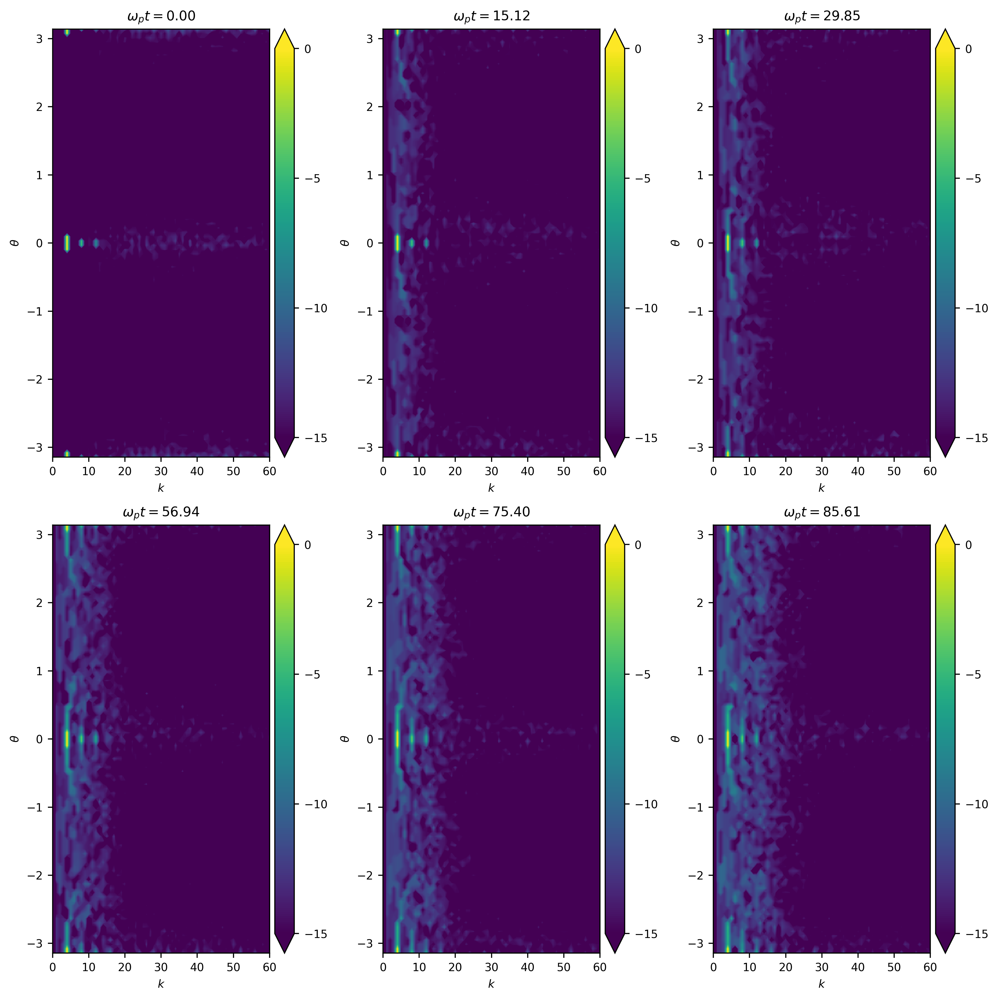

In [9]:
num_rows = 2
num_cols = 3



N = 512
L = 2*m.pi

fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))

j = 0

variance =[]
integral = []
polar_integral = []

for i in ind_time:
    eta = eta_series[i]
    
    k, F_center, F_center_polar_integrated , F_center_polar , k_tile, kxp_tile, kyp_tile , theta_tile , theta , variance, integral, polar_integral , kx, ky = spectrum_integration(eta-np.mean(eta), N,L,CHECK=True)
    
    vmin = -15
    vmax= 0
    levels = np.linspace(vmin, vmax, 200)
    
    
    plt.contourf(k_tile,theta_tile,np.log(F_center_polar/np.max(F_center_polar)), levels=levels,  extend='both' )#, cmap='viridis')
    
    ax = axes[j // num_cols, j % num_cols]

    im = ax.contourf(k_tile,theta_tile,np.log(F_center_polar/np.max(F_center_polar)), levels=levels ,  extend='both')#, cmap='viridis')
    
    #ax.scatter(4,0,marker ='*', s=1, alpha= 1, c='r' )
    
    ax.set_title(label=r'$\omega_{p} t=%.2f$'%(omegap*(time[i]-tstart)))
    
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    cbar.ax.yaxis.set_major_locator(plt.FixedLocator([-20, -15, -10, -5, 0]))
    
    ax.set_xlim([0,60])
    ax.set_xlabel('$k$')
    ax.set_ylabel(r"$ \theta $")
    j += 1
    

plt.tight_layout()
#plt.savefig("g1_tend", dpi=300)
plt.show()

## E(k): Spectral energy density 

Now we integrate the energy along the angle theta in order to obtain the energy in function of k $ \rightarrow E(k) = \int |\hat{\eta}(k,\theta)|^{2} k d\theta $

[ 4  8 12 16 20]


findfont: Font family ['Open Sans'] not found. Falling back to DejaVu Sans.


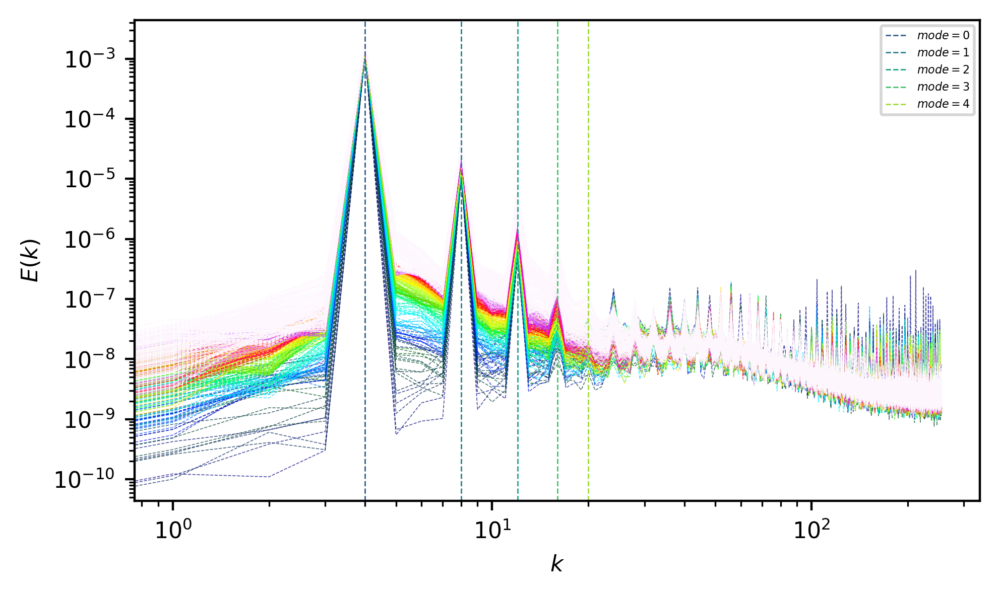

In [10]:
import matplotlib.cm as cm

fig = plt.figure(figsize=[5, 3])
ax = fig.gca()

num_rows = 2
num_cols = 3

N = 512
L = 2 * np.pi

j = 0

variance = []
integral = []
polar_integral = []

# modes growth
energy_mode = []
coordx_mode = []

filtered_coordx_mode = []
filtered_energy_mode = []

for i in range(len(eta_series)):
    eta = eta_series[i]

    k, F_center, F_center_polar_integrated, F_center_polar, k_tile, kxp_tile, kyp_tile, theta_tile, theta, variance, integral, polar_integral, kx, ky = spectrum_integration(
        eta - np.mean(eta), N, L, CHECK=False)
    
    if i == 0:
        
        filtered_indices = np.where((k > 1) & (k <= 20))[0]  # Obtener los índices correspondientes en el rango de k deseado
        indices = np.argsort(-F_center_polar_integrated[filtered_indices])[:5]  # Tomar solo los 4 máximos dentro del rango filtrado
        indices = filtered_indices[indices]  # Obtener los índices correspondientes en el array completo
        indices = np.sort(indices)
        print(indices)

        
        
    energy = F_center_polar_integrated[indices]
    
    coordx = k[indices]
    
    
    #print(energy, coordx)

    dk = k[1] - k[0]

    if i == 0:
        E0 = np.sum(F_center_polar_integrated) * dk
    
    '''
    if i == 0:
        
        max_indices = scipy.signal.argrelmax(F_center_polar_integrated)[0]  # search maximum in the initial time to localize modes
    '''    
        
    #max_energy_indices = [indexf for indexf in indices if 1 < k[indexf] <= 20]  # Filtrar según el valor de k
    
    #print(max_energy_indices)
    
    #filtered_coordx = [k[indexf] for indexf in indices]
    #filtered_energy = [F_center_polar_integrated[indexf] for indexf in indices]
    
    #print(filtered_coordx)
    
    #filtered_coordx_mode.append(filtered_coordx)  # create list with coordinates nodes
    #filtered_energy_mode.append(filtered_energy)  # create list with energy of the nodes

    psd = ax.plot(k, F_center_polar_integrated, '--', color=plt.cm.get_cmap('gist_ncar')(j), alpha=0.7, linewidth=0.3)

    energy_mode.append(energy.tolist())
    coordx_mode.append(coordx.tolist())

    j += 1

# plot where are the nodes
for a in range(len(energy_mode[0])):
    plt.axvline(x=coordx_mode[0][a], ls='--', color=plt.cm.get_cmap('viridis')((a + 2) / 7), lw=0.5,
                label=r'$mode=%.0f$' % (a))

ax.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
plt.legend(loc='upper right', fontsize=4)

plt.xscale('log')
plt.yscale('log')
ax.set_xlabel('$k$')
ax.set_ylabel('$E(k)$')
fig.tight_layout()


## Verification

$|{\eta}(x,y)|^{2} = \int E(kx,ky) \cdot  dkx \cdot dky = \int  E(k,\theta) \cdot dk$

464 464


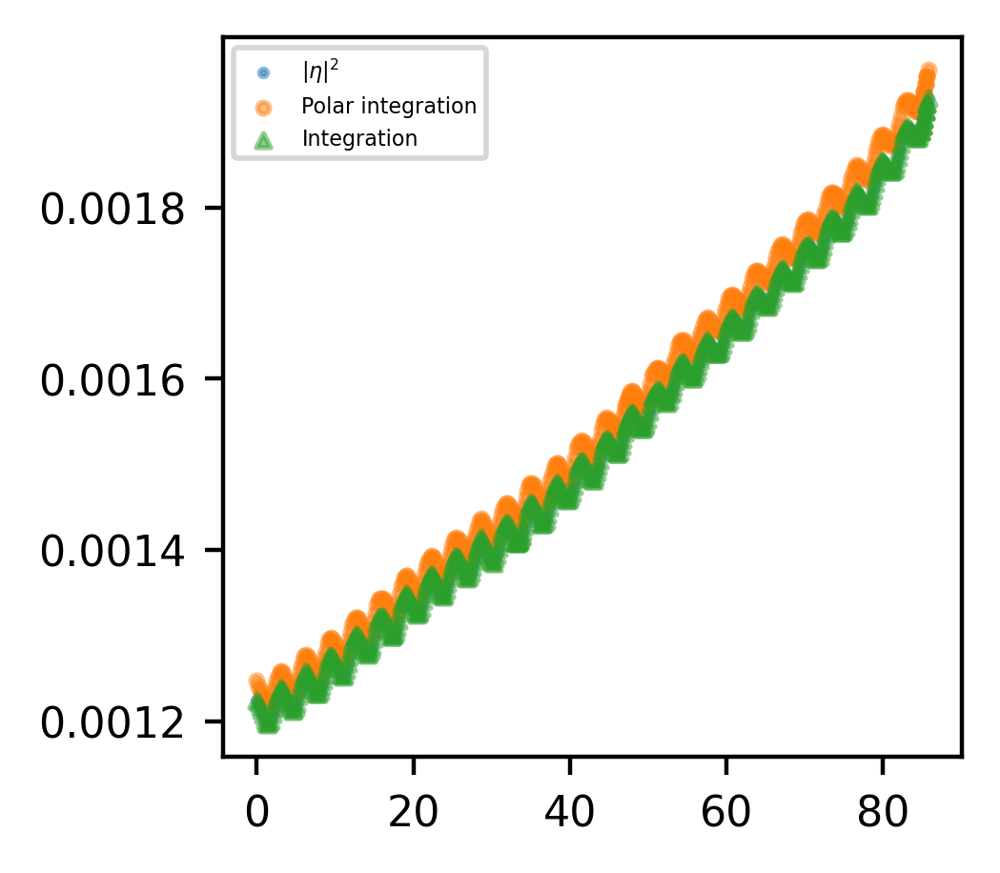

In [11]:
fig = plt.figure(figsize = [2.5,2.5]); ax = fig.gca()
tiempo = []

time = data[:,0] 

for i in range(len(eta_series)):
    tiempo.append(omegap*(time[i]-tstart))
    
print(len(tiempo), len(variance))
plt.scatter(tiempo,variance,s = 2, label = '$|\eta|^2$', alpha= 0.5)
plt.scatter(tiempo,polar_integral, s=5,label='Polar integration', alpha= 0.5)
plt.scatter(tiempo,integral, marker='^',s=7, label='Integration', alpha= 0.5)
plt.legend(loc='upper left', fontsize=4)
plt.show()

In [12]:
print(indices)

[ 4  8 12 16 20]


In [13]:

mode = []

for i in range(len(energy_mode[0])):
    energy = []
    for j in range(len(energy_mode)):
        energy.append(np.array(energy_mode[j][i]))
    mode.append(energy)


In [14]:
print(len(mode[1]))

464


k 4 slope 0.012451753372544505 SSR 0.10390463832050945 R^2 0.99097545346097
k 8 slope 0.0007157174190320349 SSR 0.0017021751398485815 R^2 0.9567955202837881
k 12 slope 0.00010252783323649363 SSR 9.104867925138494e-05 R^2 0.8946939832737354
k 16 slope 1.2885058218524922e-05 SSR 2.5781942634305627e-06 R^2 0.8257476012203826
k 20 slope 1.0008708872545027e-06 SSR 1.0155413103708702e-07 R^2 0.42058830877835585


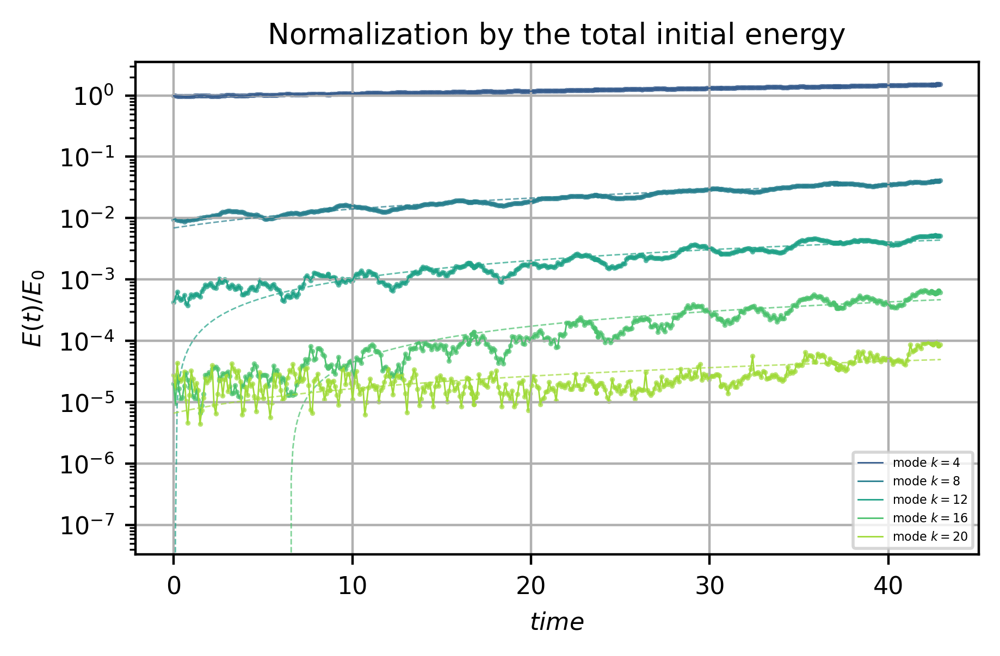

In [15]:
import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure(figsize=[5, 3])
ax_main = plt.gca()
slopes = []
ssr_values = []
r2_values = []

for i in range(len(mode)):
    # Normalize the mode values
    mode_total_norm = [x / E0 for x in mode[i]]
    
    # Plot the normalized mode
    plt.plot(time - tstart, mode_total_norm, '-', color=plt.cm.get_cmap('viridis')((i + 2) / 7), lw=0.5, label=r'mode $k=%.0f$' % (indices[i]))
    plt.scatter(time - tstart, mode_total_norm, color=plt.cm.get_cmap('viridis')((i + 2) / 7), s=0.5, alpha=0.7)

    # Fit a straight line to the data
    coefficients = np.polyfit(time - tstart, mode_total_norm, 1)
    line = np.poly1d(coefficients)
    slope = coefficients[0]

    # Calculate the y-values corresponding to the regression line
    y_line = line(time - tstart)

    # Calculate SSR (Sum of Squared Residuals)
    residuals = mode_total_norm - y_line
    ssr = np.sum(residuals ** 2)
    ssr_values.append(ssr)

    # Calculate R^2 (coefficient of determination)
    ss_total = np.sum((mode_total_norm - np.mean(mode_total_norm)) ** 2)
    r2 = 1 - (ssr / ss_total)
    r2_values.append(r2)

    # Plot the regression line on the main axis
    plt.plot(time - tstart, y_line, '--', color=plt.cm.get_cmap('viridis')((i + 2) / 7), lw=0.5, alpha=0.7)

    print('k', indices[i], 'slope', slope, 'SSR', ssr, 'R^2', r2)

    slopes.append(slope)

ax_main.ticklabel_format(style='sci', axis='y', scilimits=(0, 0))
plt.legend(loc='lower right', fontsize=4)
ax_main.set_xlabel('$time$')
ax_main.set_yscale('log')
ax_main.set_ylabel('$E(t)/E_{0}$')
ax_main.set_title("Normalization by the total initial energy")
plt.grid(True)


Taking      
$$ \large \beta (k)  \approx \frac{dE(t)}{dt}(k) $$

In [16]:
print('coord', indices, 'b(k)', slopes)

coord [ 4  8 12 16 20] b(k) [0.012451753372544505, 0.0007157174190320349, 0.00010252783323649363, 1.2885058218524922e-05, 1.0008708872545027e-06]


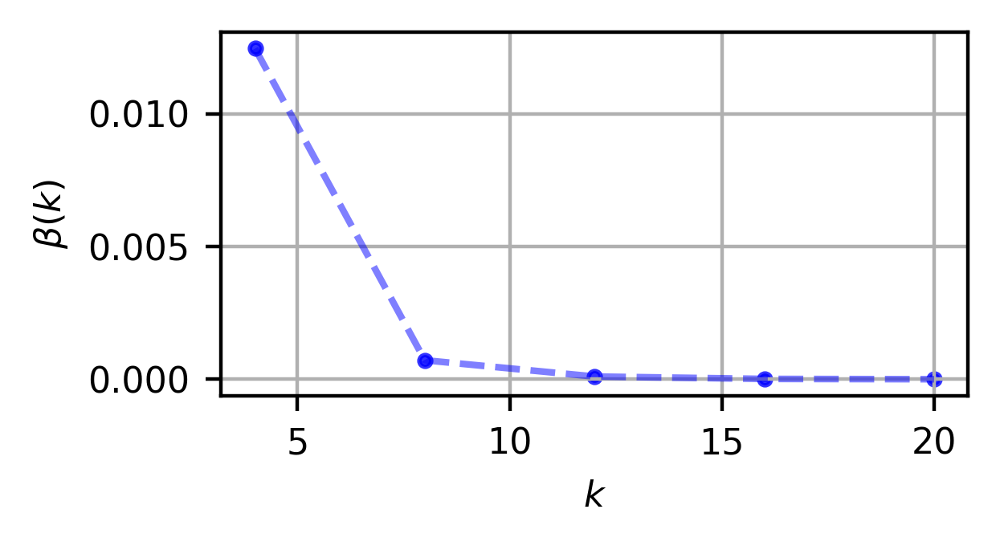

In [17]:
fig = plt.figure(figsize=[3,1.5]); ax = plt.gca()
plt.plot(indices,slopes, '--', c='b', alpha =0.5)
plt.scatter(indices,slopes, s=7, alpha =0.8, c='b')
ax.set_xlabel('$k$')
ax.set_ylabel(r'$ \beta (k) $')  
plt.grid(True)

## 3D FFT

Prepare data for easy processing

In [18]:
#NOT NECESSARY WITH NICOLO CODE

'''
N = 512
kp = 4; omegap = (1*kp)**0.5

time = data[:,0] 

Nt = len(time)

eta_series = np.zeros((Nt,N,N), dtype=np.float32)

for i in range(len(time)):
    #print('time',time[i])
    eta = eta_s
    eta_series[i] = eta
print(eta_series.shape)

data = eta_series
'''

"\nN = 512\nkp = 4; omegap = (1*kp)**0.5\n\ntime = data[:,0] \n\nNt = len(time)\n\neta_series = np.zeros((Nt,N,N), dtype=np.float32)\n\nfor i in range(len(time)):\n    #print('time',time[i])\n    eta = eta_s\n    eta_series[i] = eta\nprint(eta_series.shape)\n\ndata = eta_series\n"

The formula for the spatio-temporal fourier transform of a signal f(x,y,t):

$${\displaystyle \large F(k_x, k_y, \omega) = \iiint f(x, y, t) \, e^{-2\pi i (k_x x + k_y y + \omega t)} \, dx \, dy \, dt}$$


In our case:

$${\displaystyle \large E(k_x, k_y, \omega) = \iiint |\eta(x, y, t)|^{2} \, e^{-2\pi i (k_x x + k_y y + \omega t)} \, dx \, dy \, dt}$$

In [19]:
dt = time[1] - time[0] # sampling intervals, (s)
T = time[-1] - time[0] # total duration
Nt = eta_series.shape[0]


L0 = 2*m.pi; N = 512 # Domain size and grid number in each direction

dx = L0/N     # spatial sampling step along X in (m)
dy = L0/N      # spatial sampling step along Y in (m)
    
t_max = dt * eta_series.shape[0]  # s
x_max = dx * eta_series.shape[1]  # m
y_max = dy * eta_series.shape[2]  # m

rmax = (x_max**2 + y_max**2)**0.5
nr = Nt  #number intervals in r

radii = np.linspace(0,rmax ,nr) 

x = np.linspace(0, x_max, eta_series.shape[1])   # m
y = np.linspace(0, y_max, eta_series.shape[2])   # m
xx,yy = np.meshgrid(x, y, indexing='ij')
    
#omega = np.linspace(-np.pi/dt , np.pi/dt , data.shape[0])                          # frequency (Hz)
theta = np.linspace(-np.pi,np.pi, Nt)

wavenumber =  2*np.pi*np.fft.fftfreq(N,L0/N)
omega = 2*np.pi*np.fft.fftshift(np.fft.fftfreq(Nt,T/Nt))
kx = np.fft.fftshift(wavenumber)
ky = kx


k = wavenumber[0:int(N/2)] #only k>0
#omega = omega[0:int(Nt/2)] #only freq>0

dkx = kx[1] - kx[0]; dky = ky[1] - ky[0]
dk = k[1]-k[0]; dtheta = theta[1]-theta[0]
domega = omega[1]-omega[0]


kx_tile, ky_tile = np.meshgrid(kx,ky)# kx-ky space
Omega, K = np.meshgrid(omega, k) # k-omega space
    
k_tile, theta_tile = np.meshgrid(k,theta)  # k-theta space
kxp_tile, kyp_tile = pol2cart(k_tile, theta_tile)

Note: in the case of the 3D normalisation is multiplying by $ \large \frac{N_{t}}{N^{2}}$

In [20]:
spectrum3D = np.fft.fftn(eta_series*Nt**0.5/(N*N)**0.5) # FFT normalization 

spectrum3D = np.fft.fftshift(spectrum3D, axes=(0,1,2))

F_3D = (np.absolute(spectrum3D))**2/(N**2)/Nt/(dkx*dky*domega**2) # Per area normalization

#Fcenter_3D = np.fft.fftshift(F_3D, axes=(0,1,2))

The dimensions of data are $(N_{t},N,N)$ corresponding to $(t,x,y)$ when we apply the previous block, the dimensions of F_3D are $(N_{t},N,N)$ corresponding to $(\omega,k_{x},k_{y})$

In [21]:
F_xyomega = np.zeros((N,F_3D.shape[0],N))
F_kthetaomega = np.zeros((theta.shape[0],F_3D.shape[0],k.shape[0]))
F_komega = np.zeros((k.shape[0], F_3D.shape[0])) #dimension nr x omega

for i in range(0,F_3D.shape[0]): #loop in the frequencies(omega)
    
    F_xy = F_3D[i] # spectrum F(kx,ky) for each freq i 
    F_xyomega[:,i] = F_xy # each colum of F_xyomega is a freq
    
    F_ktheta = scipy.interpolate.griddata((kx_tile.ravel(),ky_tile.ravel()), F_xy.ravel(), (kxp_tile, kyp_tile), method='nearest') # F(omega,kx,ky) --> F(omega,k,theta) for each freq i
    F_kthetaomega[:,i] = F_ktheta  # each colum of F_kthetaomega is a freq
    
    dtheta = theta[1]-theta[0]
    
    #print(F_ktheta.shape, k_tile.shape, dtheta.shape)
    
    F_komega[:,i] = np.sum(F_ktheta*k_tile, axis=0)*dtheta #  integral in theta for each freq i so : F(k,theta) ---> F(k) for each omega ---> acces to F(k,omega)


In [22]:
print(F_kthetaomega.shape)

(464, 464, 256)


### $E(kx,ky)$ different times

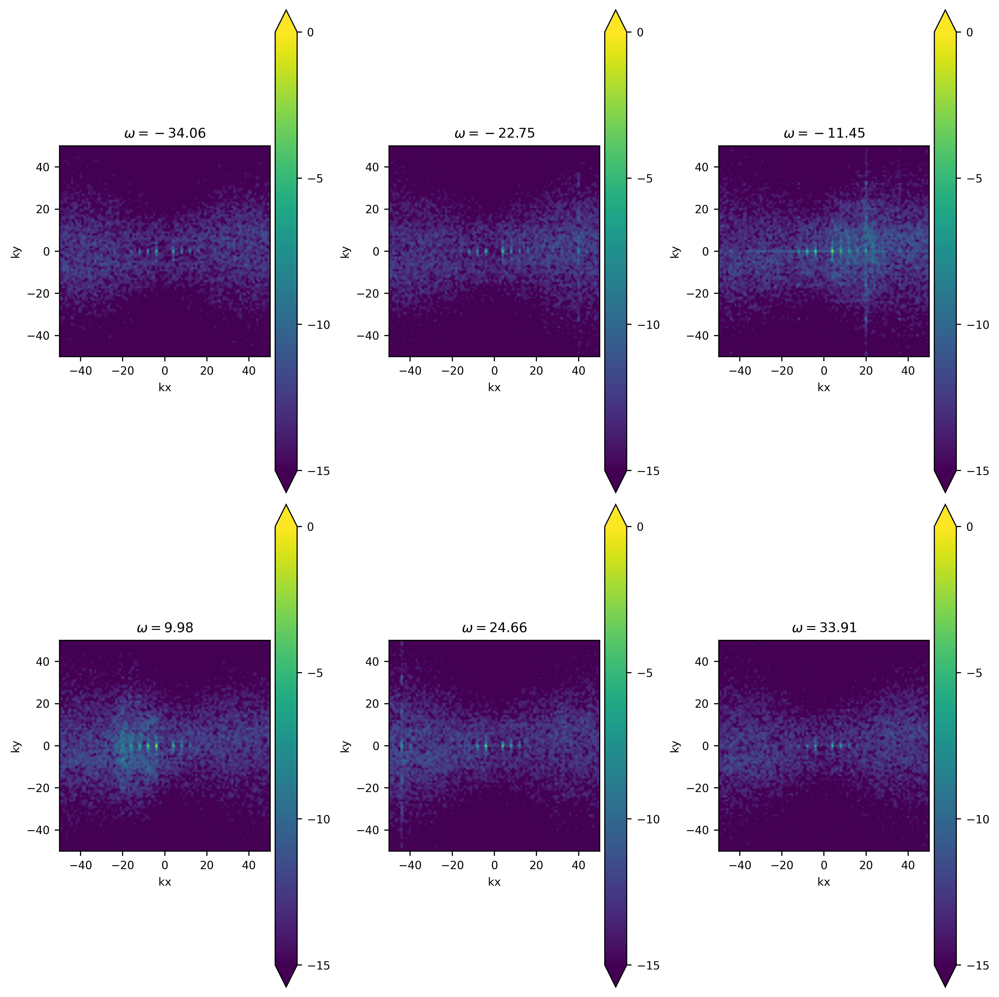

In [23]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.ticker import MaxNLocator

num_rows = 2
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(10, 10))

j = 0

N = 512
L = 2 * np.pi

for i in ind_time:
    
    vmin = -15
    vmax = 0
    levels = np.linspace(vmin, vmax, 200)
    
    ax = axes[j // num_cols, j % num_cols]
    
    norm = np.max(F_3D[i])
    
    im = ax.contourf(kx_tile, ky_tile, np.log(F_xyomega[:, i]),levels = levels, extend='both')
    
    ax.set_aspect('equal')
    ax.set_title(label=r'$\omega =%.2f$' % ((omega[i])))
    ax.set_xlabel('kx')
    ax.set_ylabel('ky')
    ax.set_ylim([-50, 50])
    ax.set_xlim([-50, 50])
    
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
    
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    cbar.ax.yaxis.set_major_locator(plt.FixedLocator([ -15, -10, -5, 0]))
    
    j += 1
    
plt.tight_layout()
plt.show()

### $E(kx,ky)$ in average on time 

NameError: name 'filtered_coordx' is not defined

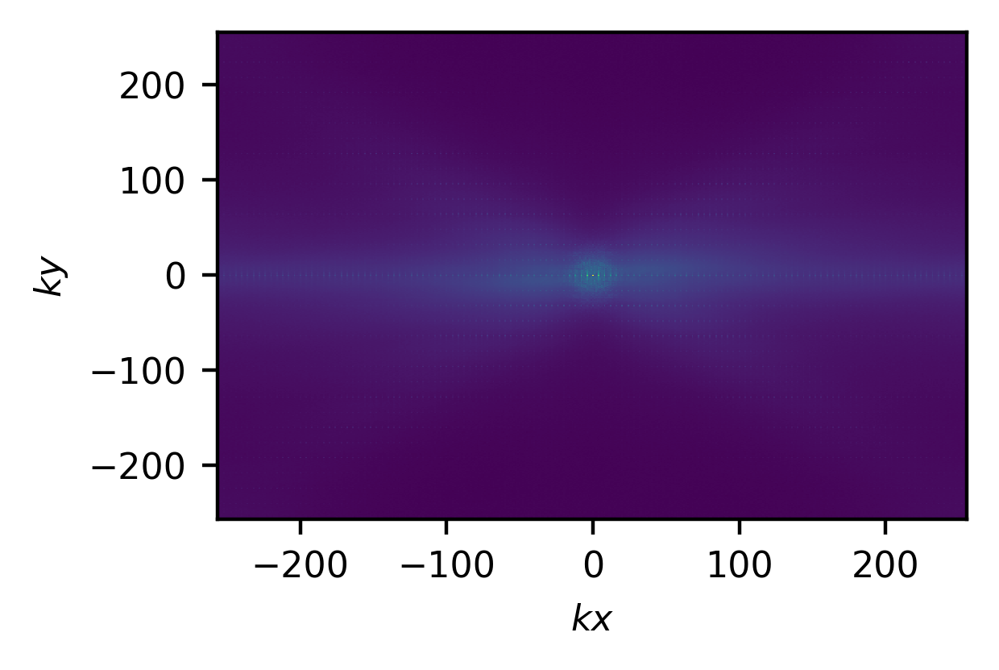

In [24]:
''' Solve the problem with colorbar and interval '''

fig = plt.figure(figsize=[3,2]); ax = plt.gca()
F_kxky = np.average(F_xyomega, axis=1) #average in time , also we can select a specific time --> interesting to see before and after microbreaking 
psd = plt.pcolormesh(kx_tile, ky_tile,np.log(F_kxky) , shading= 'auto')#,vmin=-30, vmax= 0)
plt.xlabel(r"$kx$")#, labelpad=0)
plt.ylabel('$ky$')#, labelpad=0)

# Definir el radio
r = [4,8,12,16]
angle = np.linspace(0, 2*np.pi, 100)
i=0

for radio in r:
    x = radio * np.cos(angle)
    y = radio * np.sin(angle)
    
    plt.plot(x,y, ls = '--', alpha = 0.5, color='w', lw=0.5, label = r'$mode k=%.0f$'% (filtered_coordx[i]))
    i+=1

ax.set_xlim([-20,20])
ax.set_ylim([-20,20])
#cbaxes = fig.add_axes([0.4h, -0.2, 0.5, 0.04]) 
cbar = plt.colorbar(psd,  orientation='vertical')

### $E(k, \theta) $ in different frequencies

In [ ]:

num_rows = 2
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(8, 8))

j = 0

N = 512
L = 2 * np.pi

for i in ind_time:
    
    vmin = -15
    vmax = 0
    levels = np.linspace(vmin, vmax, 200)
    
    ax = axes[j // num_cols, j % num_cols]

    im = ax.contourf(k_tile, theta_tile, (np.log(F_kthetaomega[:,i])),levels = levels, extend='both')
    
    ax.set_title(label=r'$\omega=%.2f$' % (omega[i]))
    ax.set_xlabel('$k$')
    ax.set_ylabel(r"$ \theta $")
    ax.set_xlim([0, 100])
    
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
    
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    cbar.ax.yaxis.set_major_locator(plt.FixedLocator([ -15, -10, -5, 0]))
    
    j += 1
    
plt.tight_layout()
plt.show()

### $E(k, \theta) $ averaged in time

In [ ]:
fig = plt.figure(figsize=[3,2]); ax = plt.gca()

F_kthetaav = np.average(F_kthetaomega, axis=1)  #also we can select a specific time --> interesting to see before and after microbreaking
pu = plt.axvline( x=4, ls = '--', c ='w', alpha = 0.3, lw=0.5, label = r"$k=4$")
pu = plt.axvline( x=8, ls = '--', c ='r', alpha = 0.5, lw=0.5, label = r"$k=8$")
pu = plt.axvline( x=12, ls = '--', c ='y', alpha = 0.5, lw=0.5, label = r"$k=12$")
pu = plt.axvline( x=16, ls = '--', c ='g', alpha = 0.5, lw=0.5, label = r"$k=16$")
psd = plt.pcolormesh(k,theta,np.log(F_kthetaav), shading= 'auto')
plt.scatter(4,-m.pi,marker ='*', s=1, alpha= 1, c='w' )
plt.scatter(4,m.pi,marker ='*', s=1, alpha= 1, c='w' )
plt.scatter(4,0,marker ='*', s=1, alpha= 1, c='w' )
plt.ylabel(r"$\theta$", labelpad=0)
plt.xlabel('$k$', labelpad=0)
plt.legend(loc='upper right', fontsize=4)
ax.set_xlim([0,100])
cbar = plt.colorbar(psd, orientation='vertical')

## <span style="color:red"> THIS IS TEST TO SEE IF I CAN UNDERSTAND WHY I HAVE THE LINES IN $E(\omega, k)$ </span>

In [ ]:

'''
F_xyomega = np.zeros((N,F_3D.shape[0],N))
F_kthetaomega = np.zeros((theta.shape[0],F_3D.shape[0],k.shape[0]))
F_komega = np.zeros((256, F_3D.shape[0])) #dimension nr x omega

for i in range(0,F_3D.shape[0]):
    F_xy = F_3D[i]
    F_xyomega[:,i] = F_xy
    F_ktheta = scipy.interpolate.griddata((kx_tile.ravel(),ky_tile.ravel()), F_xy.ravel(), (kxp_tile, kyp_tile), method='nearest')
    F_kthetaomega[:,i] = F_ktheta
    dtheta = theta[1]-theta[0]
    #print(F_xy.shape, F_ktheta.shape,k_tile.shape, dtheta.shape)
    F_komega[:,i] = np.sum(F_ktheta*k_tile, axis=0)*dtheta # axis 0 -> integral in time


'''
g=1

#when we take F_kthetaomega[i] we take the row i of F_kthetaomega , which dimension is (310, 310, 256) so we take different heights? 

ind_time = [0,77,154,300,400,-1]

num_rows = 2
num_cols = 3

fig, axes = plt.subplots(num_rows, num_cols, figsize=(6, 6))

j = 0

N = 512
L = 2 * np.pi

for i in ind_time:
    
    vmin = -15
    vmax = 0
    levels = np.linspace(vmin, vmax, 200)
    
    ax = axes[j // num_cols, j % num_cols]
    
    #F_komega1 = np.sum(F_kthetaomega[:,i]*k_tile, axis=0)*dtheta # F(k)
    
    #print(F_komega1.shape, k.shape, omega.shape)
    
    ax.contourf(k,omega,np.log(F_kthetaomega[i]), levels = levels , extend='both')
    
    
    im = plt.contourf(k,omega,np.log(F_kthetaomega[i]),levels = levels, extend='both')                      #.contourf(k_tile, Omega, np.log(F_komega.T),levels = levels, extend='both')
    
    ax.plot(k, (k*g)**0.5,':', lw =0.5 , c ='w', label = r"$\omega= \sqrt{gk}$")
    
    #ax.set_title(label=r'$\omega_{p} t=%.2f$' % (omegap * (case7.t[i] - tstart)))
    ax.set_xlabel('$k$')
    ax.set_ylabel(r"$ \omega$")
    ax.set_xlim([0, 50])
    
    cbar = fig.colorbar(im, ax=ax, orientation='vertical', pad=0.02)
    
    cbar.ax.yaxis.set_major_locator(MaxNLocator(integer=True))
    cbar.ax.yaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'${int(x)}$'))
    cbar.ax.yaxis.set_major_locator(plt.FixedLocator([ -15, -10, -5, 0]))
    
    j += 1
    
plt.tight_layout()
plt.show()

### $E(\theta, \omega)$

In [ ]:
fig = plt.figure(figsize=[3,2]); ax = plt.gca()
#print(F_komega.shape)
pa = plt.pcolormesh(k,omega,np.log(F_komega.T),shading='nearest') #{'flat', 'nearest', 'gouraud', 'auto'}

print(F_komega.shape)
omega_max=[]


for xk in indices:
    max_indexk = np.argmax(np.log(F_komega[int(xk),:]))
    omega_max.append(np.abs(omega[max_indexk]))



omega_max = np.array(omega_max)
filtered_coordx = np.array(indices)

c = (9.8*m.pi/2 + 1 *2/(m.pi*850))**0.5
rho =9.8
sigma = 1

#print('k value' , filtered_coordx,'omega value',omega_max,omega_max.shape)

pu = plt.scatter(filtered_coordx  , np.array(omega_max),marker='*',s=0.5, c ='k', alpha = 0.7)

pu = plt.axvline( x=4, ls = '--', c ='k', alpha = 0.5, lw=0.5, label = r"$k=4$")
pu = plt.axvline( x=8, ls = '--', c ='r', alpha = 0.5, lw=0.5, label = r"$k=8$")
pu = plt.axvline( x=12, ls = '--', c ='y', alpha = 0.5, lw=0.5, label = r"$k=12$")
pu = plt.axvline( x=16, ls = '--', c ='g', alpha = 0.5, lw=0.5, label = r"$k=16$")


kp = 4
g = 1
lc = 0.44/kp
omegap = (kp*g)**0.5
omega_lc = (2*np.pi/lc*g + g/kp**2/200*(2*np.pi/lc)**3)**0.5


plt.plot(filtered_coordx , (omega_max),':',lw=0.5, c ='k', alpha = 0.7)

# Perform linear regression
slope, intercept = np.polyfit(filtered_coordx[:3], omega_max[:3], deg=1)

# Plot the line
plt.plot(k, intercept + slope * k, 'k', lw=0.5,  alpha = 0.7,
         label=r'$%.2f + %.2f \cdot k$' % (intercept, slope))


plt.plot(k, (k*g)**0.5,':', lw =0.5 , c ='w', label = r"$\omega= \sqrt{gk}$")

plt.ylabel('$\omega$', labelpad=0)
plt.xlabel('$k$', labelpad=0)
plt.legend(loc='upper right', fontsize=4)
ax.set_xlim([0,30])
ax.set_ylim([0,30])
#cbaxes = fig.add_axes([0.4, -0.2, 0.5, 0.04]) 
cbar = plt.colorbar(pa, orientation='vertical')

In [ ]:
fig = plt.figure(figsize=[3,2]); ax = plt.gca()
ratio = omega_max/filtered_coordx
#print('k value' , filtered_coordx.shape,'omega value',omega_max, 'ratio', ratio.shape)

plt.plot(filtered_coordx[:-1], ratio[:-1] , 'o-' , alpha =0.7)
ax.set_ylim([0,1])
plt.ylabel('$\omega / k$', labelpad=0)
plt.xlabel('$k$', labelpad=0)
plt.grid(True)
print(ratio)

In [ ]:
fig = plt.figure(figsize=[3,2])
ax = plt.gca()

ratio = omega_max / filtered_coordx

# Calcular la velocidad de grupo aproximada
group_velocity = np.diff(omega) / np.diff(k[:139])

plt.plot(filtered_coordx[:-1], ratio[:-1], 'o-', alpha=0.7, label = r"$\omega/k}$")
ax.set_ylim([0, 1])
#plt.ylabel('$\omega / k$', labelpad=0)
plt.xlabel('$k$', labelpad=0)
plt.grid(True)

# grou velocity
plt.plot(np.linspace(filtered_coordx[0],filtered_coordx[-1],138), group_velocity , 'r', alpha=0.7 ,lw = 1, label = r"$d\omega/ dk$")
plt.legend(loc='upper right', fontsize=4)
plt.show()


# Representation spatio-temporal energy

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import colors

fig = plt.figure(figsize=(12,6))

ax = fig.add_subplot(111, projection='3d')
rango = (0, 50)

# Filtrar los valores de K, Omega y F_komega dentro del rango deseado
k_filtered = np.where((K >= rango[0]) & (K <= rango[1]), K, np.nan)
omega_filtered = np.where((Omega >= rango[0]) & (Omega <= rango[1]), Omega, np.nan)
#F_komega_filtered = np.where((K >= rango[0]) & (K <= rango[1]) & (Omega >= rango[0]) & (Omega <= rango[1]), np.log(F_komega), np.nan)
F_komega_filtered = np.where((K >= rango[0]) & (K <= rango[1]) & (Omega >= rango[0]) & (Omega <= rango[1]), np.log(np.where(F_komega > 0, F_komega, np.nan)), np.nan)

# Crear la superficie 3D

cset = ax.contourf(k_filtered, omega_filtered, F_komega_filtered, zdir='z', offset=-17,alpha=0.8, cmap='viridis',)
surf = ax.plot_surface(k_filtered, omega_filtered, (F_komega_filtered), alpha=0.9,cmap='viridis', rstride=1, cstride=1 , vmin=-15, vmax=0)

fig.colorbar(surf, ax=ax, shrink=0.5, aspect=5)
ax.set_xlabel('K')
ax.set_ylabel('$\omega$')
ax.set_zlabel('$log(E(k,\omega))$')
ax.set_zlim(-17, 4) 

plt.show()